# 10_K2_pseudobulk.ipynb

1. Produce a simple lattice graph structure derived spatially
1. For each possible pair of cells/spots --> sum their expression values
1. Run SIMBA on this merged cells.

Local communities in a homogenous region will look the same. Local communities at borders will look different. 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from src.plot import plot_spatial, palette_celltype, plot_obs_spatial
import pandas as pd
import numpy as np
palette_entity_anno = palette_celltype.copy()
palette_entity_anno['gene'] = "lightgray"
from mpl_toolkits.axes_grid1 import make_axes_locatable
import anndata as ad


In [3]:
import os
import simba as si

/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
workdir = 'data/10'
si.settings.set_workdir(workdir)

Saving results in: data/10


In [5]:
si.settings.set_figure_params(dpi=80,
                              style='white',
                              fig_size=[5,5],
                              rc={'image.cmap': 'viridis'})

# make plots prettier
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina')

In [6]:
adata_fn = "/data/pinello/PROJECTS/2025-01-31_CC_Spatial_SIMBA/SIMBA_in_space/data/human_DLPFC/151507.h5ad"
adata = sc.read_h5ad(adata_fn)

## Generate pairwise gene expression data

In [7]:
adata

AnnData object with n_obs × n_vars = 4221 × 15818
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'spatialLIBD', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [8]:
# ChatGPT
import numpy as np
from scipy.spatial import KDTree

def sum_adjacent_cells(expression_matrix, coordinates, distance_threshold=1.0):
    """
    Compute the sum of expression levels for all pairs of adjacent cells.

    Parameters:
        expression_matrix (ndarray): Shape (n, m), expression levels of m genes in n cells.
        coordinates (ndarray): Shape (n, 2), (x, y) spatial coordinates of n cells.
        distance_threshold (float): Maximum distance to consider cells as adjacent.

    Returns:
        list of tuples: [(index1, index2, summed_expression)], where summed_expression is shape (m,).
    """
    tree = KDTree(coordinates)
    pairs = tree.query_pairs(distance_threshold)  # Get indices of adjacent cells

    summed_expressions = [
        (i, j, expression_matrix[i] + expression_matrix[j])
        for i, j in pairs
    ]
    
    return summed_expressions

In [9]:
tree = KDTree(adata.obsm['spatial'])

In [13]:
spots = adata.obsm['spatial']

Already deduplicated

In [12]:
pairs = tree.query_pairs(250)  # by eye

In [13]:
len(pairs)

24581

In [16]:
pair_idx = np.array(list(pairs))
pair_idx

array([[ 682, 4118],
       [ 100,  730],
       [1826, 2291],
       ...,
       [ 129, 1310],
       [ 720, 3471],
       [1385, 3861]])

In [17]:
cell_1_bc = adata.obs_names[pair_idx[:, 0]].to_numpy()
cell_2_bc = adata.obs_names[pair_idx[:, 1]].to_numpy()

In [18]:
obs_df = pd.DataFrame(
    {
        'cell_1_barcode': cell_1_bc,
        'cell_2_barcode': cell_2_bc,
    }
)

Average of their locations

In [19]:
pair_spatial = (adata[cell_1_bc].obsm['spatial'] + adata[cell_2_bc].obsm['spatial']) / 2

In [20]:
cell_1_X = adata[cell_1_bc].X
cell_2_X = adata[cell_2_bc].X

In [21]:
k2_adata = ad.AnnData(
    X=cell_1_X + cell_2_X,
    obs=obs_df,
    var=adata.var.copy()
)
k2_adata.obsm['spatial'] = pair_spatial

/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_simba_only/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [22]:
k2_adata

AnnData object with n_obs × n_vars = 24581 × 15818
    obs: 'cell_1_barcode', 'cell_2_barcode'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial'

# SIMBA

In [23]:
si.pp.cal_qc_rna(k2_adata)

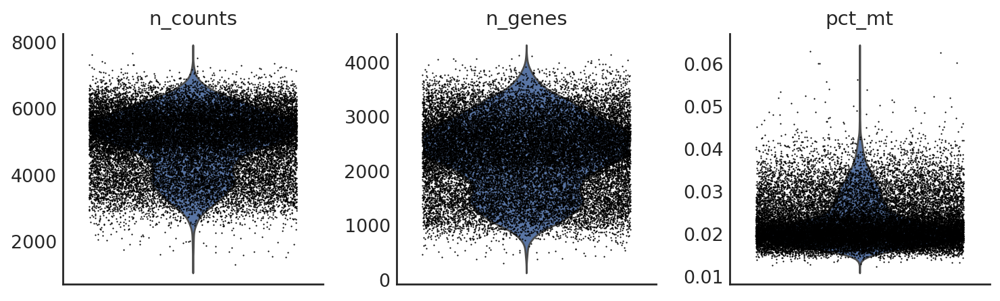

In [24]:
si.pl.violin(k2_adata,list_obs=['n_counts','n_genes','pct_mt'])

In [25]:
si.pp.normalize(k2_adata,method='lib_size')
si.pp.log_transform(k2_adata)

2000 variable genes are selected.


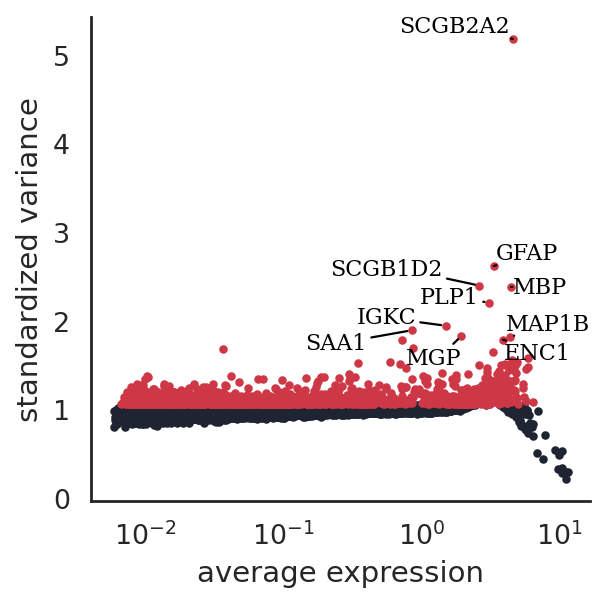

In [26]:
si.pp.select_variable_genes(k2_adata, n_top_genes=2000)
si.pl.variable_genes(k2_adata,show_texts=True)

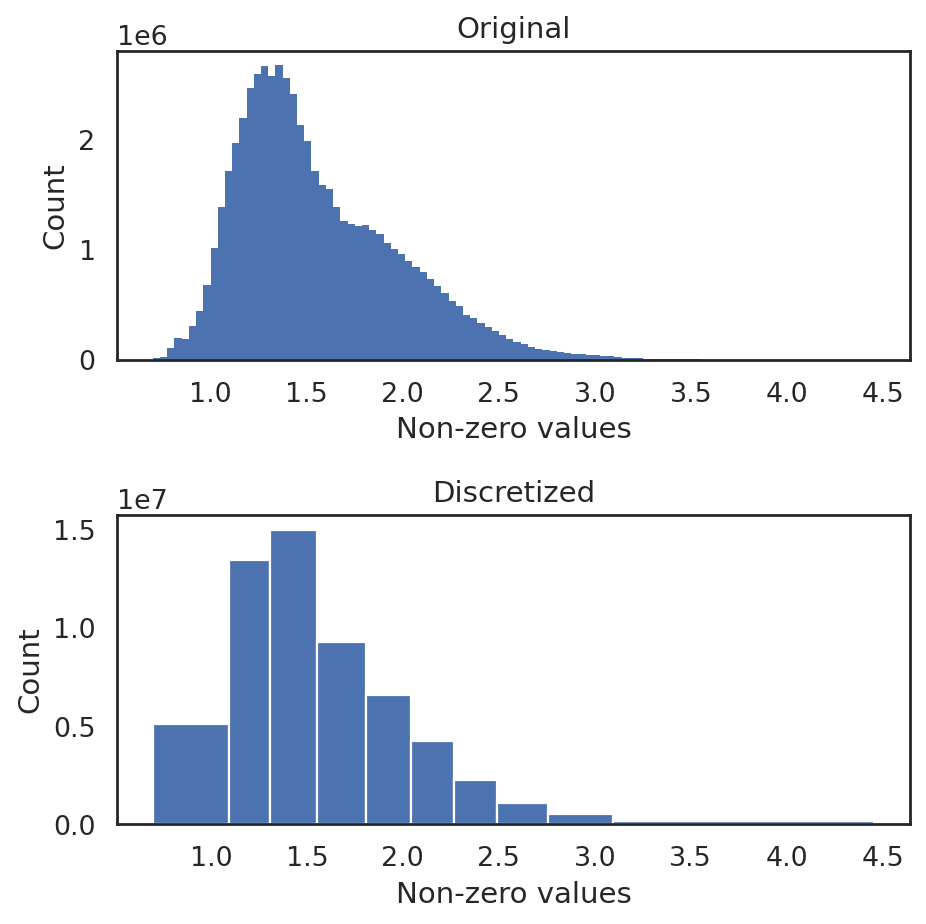

In [27]:
si.tl.discretize(k2_adata,n_bins=10)
si.pl.discretize(k2_adata,kde=False)

In [28]:
si.tl.gen_graph(list_CG=[k2_adata],
                layer='simba',
                use_highly_variable=False,
                dirname='graph0')

Processing CG: 100%|██████████| 1/1 [00:09<00:00,  9.71s/it]


relation0: source: C, destination: G
#edges: 5079442
relation1: source: C, destination: G
#edges: 13475545
relation2: source: C, destination: G
#edges: 15007782
relation3: source: C, destination: G
#edges: 9280482
relation4: source: C, destination: G
#edges: 6572577
relation5: source: C, destination: G
#edges: 4216938
relation6: source: C, destination: G
#edges: 2255279
relation7: source: C, destination: G
#edges: 1066057
relation8: source: C, destination: G
#edges: 484828
relation9: source: C, destination: G
#edges: 147666
Total number of edges: 57586596
Writing graph file "pbg_graph.txt" to "data/10/pbg/graph0" ...
Finished.


In [29]:
si.tl.pbg_train(auto_wd=True, save_wd=True, output='model')

Auto-estimated weight decay is 4.105364E-04
`.settings.pbg_params['wd']` has been updated to 4.105364E-04
Converting input data ...
[2025-02-18 21:03:33.475753] Found some files that indicate that the input data has already been preprocessed, not doing it again.
[2025-02-18 21:03:33.476156] These files are in: data/10/pbg/graph0/input/entity, data/10/pbg/graph0/input/edge


Starting training ...
@Holder: EmbeddingHolder(
  nparts_lhs=1,
  nparts_rhs=1,
  lhs_unpartitioned_types=set(),
  lhs_partitioned_types={'C'},
  rhs_unpartitioned_types=set(),
  rhs_partitioned_types={'G'},
  unpartitioned_embeddings={
    
  },
  partitioned_embeddings={
    
  }
)
entity_counts:{'C': [24581], 'G': [15818]}
Finished


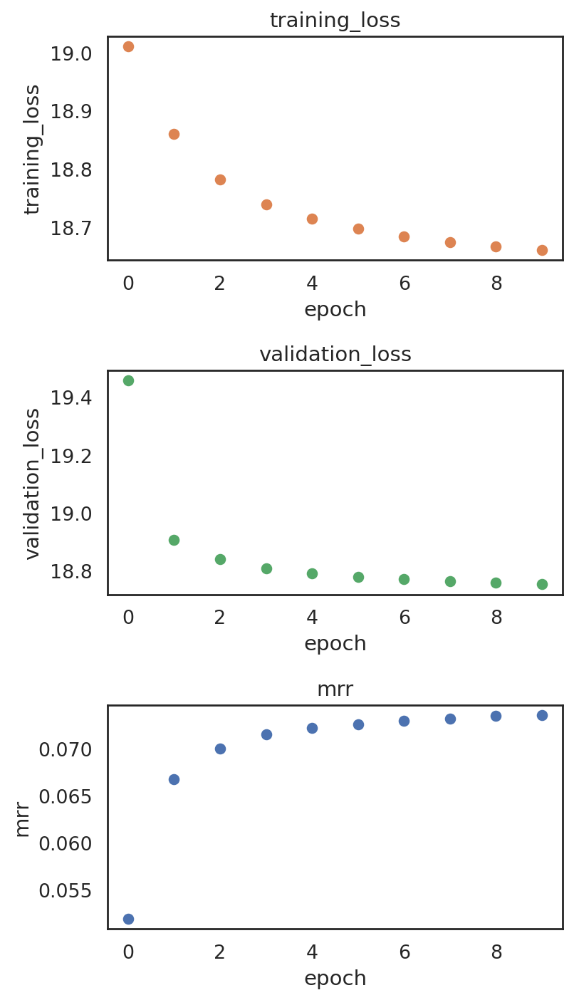

In [30]:
si.pl.pbg_metrics(fig_ncol=1)

In [73]:
k2_adata_fn = f'{workdir}/k2_adata.h5ad'
k2_adata_fn

'data/10/k2_adata.h5ad'

In [74]:
k2_adata.write(k2_adata_fn)

## Post training analysis

In [31]:
dict_adata = si.read_embedding()
dict_adata

{'G': AnnData object with n_obs × n_vars = 15818 × 50,
 'C': AnnData object with n_obs × n_vars = 24581 × 50}

In [32]:
adata_C = dict_adata['C']  # embeddings of cells
adata_G = dict_adata['G']  # embeddings of genes

In [33]:
adata_C.obs = k2_adata[adata_C.obs.index].obs.copy()

In [34]:
adata_C.obs['spatialLIBD_1'] = adata[adata_C.obs['cell_1_barcode'],:].obs['spatialLIBD'].set_axis(adata_C.obs.index).copy()
adata_C.obs['spatialLIBD_2'] = adata[adata_C.obs['cell_2_barcode'],:].obs['spatialLIBD'].set_axis(adata_C.obs.index).copy()

In [36]:
adata_C.obs['spatialLIB_combined'] = adata_C.obs.apply(lambda r: '-'.join(list(np.sort(r[['spatialLIBD_1', 'spatialLIBD_2']].tolist()))), axis=1)

In [37]:
adata_C.obs['spatialLIB_combined'].value_counts()

L3-L3    6711
L1-L1    4459
L5-L5    3592
L6-L6    2494
WM-WM    1826
L4-L4    1783
L2-L2    1287
L1-L2     524
L2-L3     457
L4-L5     411
L3-L4     397
L5-L6     373
L6-WM     267
Name: spatialLIB_combined, dtype: int64

In [38]:
palette_celltype

{'L1': '#eb34a8',
 'L2': '#3486eb',
 'L3': '#34eb5b',
 'L4': '#ae34eb',
 'L5': '#ebdb34',
 'L6': '#eb9234',
 'WM': '#000000'}

In [17]:
paired_palette_celltype = {
    'L3-L3': '#34eb5b', 
    'L1-L1': '#eb34a8', 
    'L5-L5': '#ebdb34', 
    'L6-L6': '#eb9234', 
    'WM-WM': 'lightgray',#'#000000', 
    'L4-L4': '#ae34eb', 
    'L2-L2': '#3486eb', 
    'L1-L2': 'black', 
    'L2-L3': 'brown', 
    'L4-L5': 'brown', 
    'L3-L4': 'brown', 
    'L5-L6': 'brown', 
    'L6-WM': 'brown', 
}

In [40]:
si.tl.umap(adata_C,n_neighbors=15,n_components=2)

OMP: Info #277: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


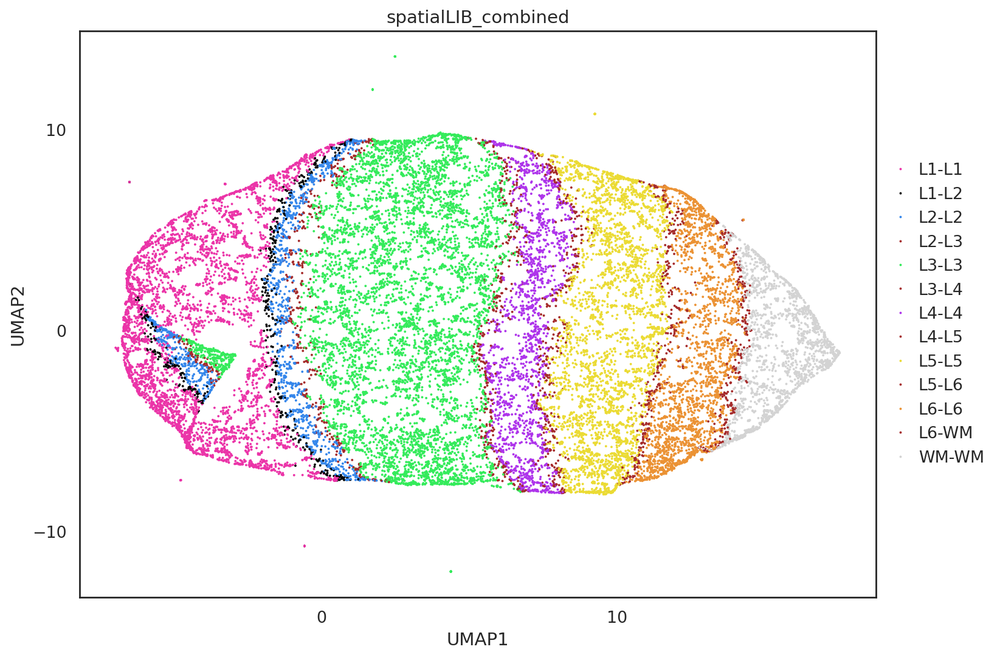

In [41]:
si.pl.umap(
    adata_C,color=['spatialLIB_combined'],
    dict_palette={'spatialLIB_combined': paired_palette_celltype},
    fig_size=(10,7),
    drawing_order='random',
    size=3
)

Since I used all possible pairs, the spatial information is encoded? Sampling all the data multiple times. 

Try larger k, and add AFTER normalization?

In [42]:
sc.tl.pca(adata_C)

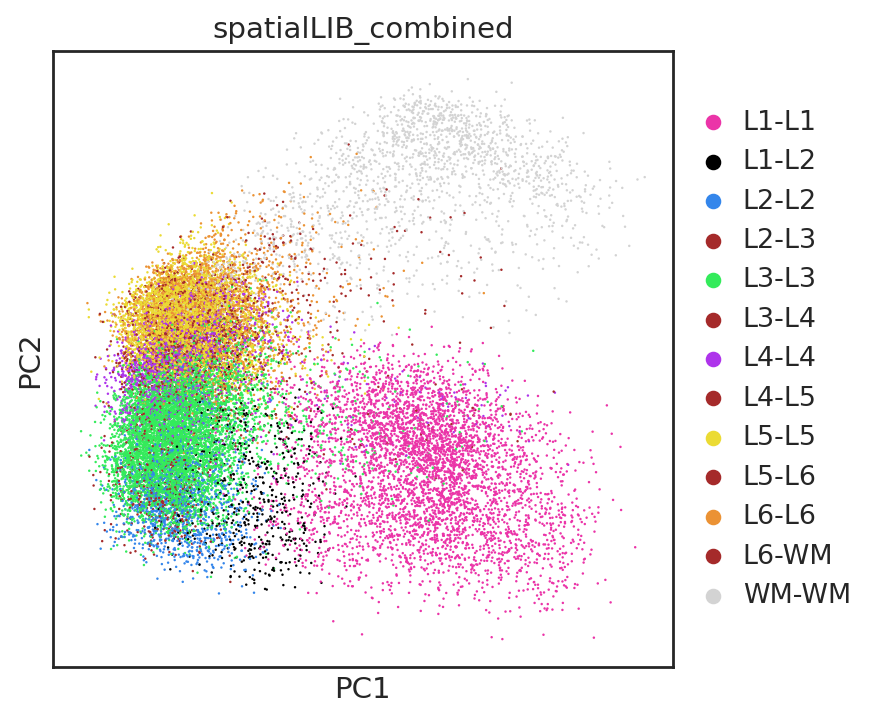

In [43]:
sc.pl.pca(adata_C, color=['spatialLIB_combined'], dimensions=(0, 1), palette=paired_palette_celltype)

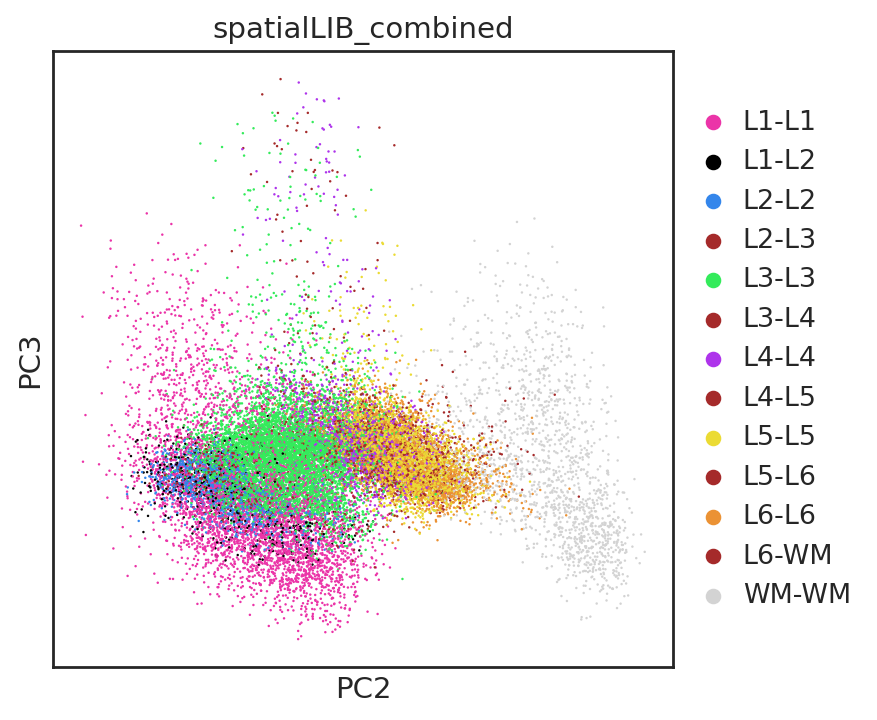

In [44]:
sc.pl.pca(adata_C, color=['spatialLIB_combined'], dimensions=(1, 2), palette=paired_palette_celltype)

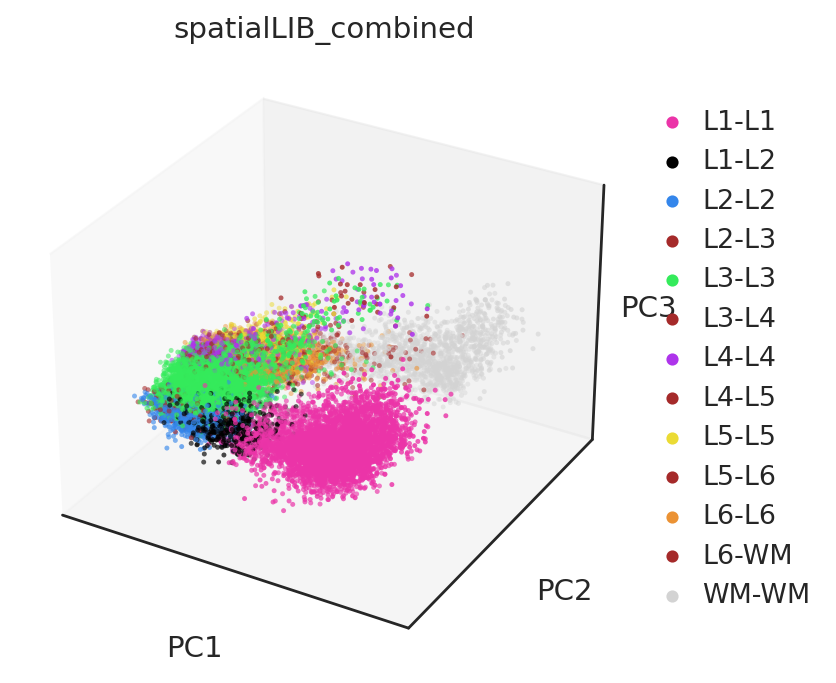

In [45]:
sc.pl.pca(adata_C, color=['spatialLIB_combined'], palette=paired_palette_celltype, projection='3d')

In [46]:
import plotly.express as px
def plotly_PCA_3d(adata, obs_col, color_discrete_map=None):
    fig = px.scatter_3d(
        x=adata.obsm['X_pca'][:, 0], 
        y=adata.obsm['X_pca'][:, 1], 
        z=adata.obsm['X_pca'][:, 2],
        color = adata.obs[obs_col],
        width=500, height=500,
        color_discrete_map=color_discrete_map
    )
    fig.update_layout(#plot_bgcolor='rgb(12,163,135)',
                      #paper_bgcolor='rgb(12,163,135)'
                      #coloraxis={"colorbar": {"x": -0.2, "len": 0.5, "y": 0.8}}, #I think this is for contours
                     scene = dict(
                                    xaxis = dict(
                                         backgroundcolor="rgba(0, 0, 0,0)",
                                         gridcolor="white",
                                         showbackground=True,
                                         zerolinecolor="white",),
                                    yaxis = dict(
                                        backgroundcolor="rgba(0, 0, 0,0)",
                                        gridcolor="white",
                                        showbackground=True,
                                        zerolinecolor="white"),
                                    zaxis = dict(
                                        backgroundcolor="rgba(0, 0, 0,0)",
                                        gridcolor="white",
                                        showbackground=True,
                                        zerolinecolor="white",),),
                     )
    fig.update_traces(marker=dict(size=2))
    fig.show()

In [47]:
paired_palette_celltype

{'L3-L3': '#34eb5b',
 'L1-L1': '#eb34a8',
 'L5-L5': '#ebdb34',
 'L6-L6': '#eb9234',
 'WM-WM': 'lightgray',
 'L4-L4': '#ae34eb',
 'L2-L2': '#3486eb',
 'L1-L2': 'black',
 'L2-L3': 'brown',
 'L4-L5': 'brown',
 'L3-L4': 'brown',
 'L5-L6': 'brown',
 'L6-WM': 'brown'}

In [48]:
plotly_PCA_3d(adata_C, obs_col='spatialLIB_combined', color_discrete_map=paired_palette_celltype)

# Cluster

In [49]:
sc.pp.neighbors(adata_C, n_neighbors=60)
sc.tl.leiden(adata_C)

/tmp/ipykernel_1401777/4264543245.py:2: FutureWarning:

In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.



/data/pinello/PROJECTS/2021_01_JY_SIMBA/simba/simba/plotting/_plot.py:783: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.



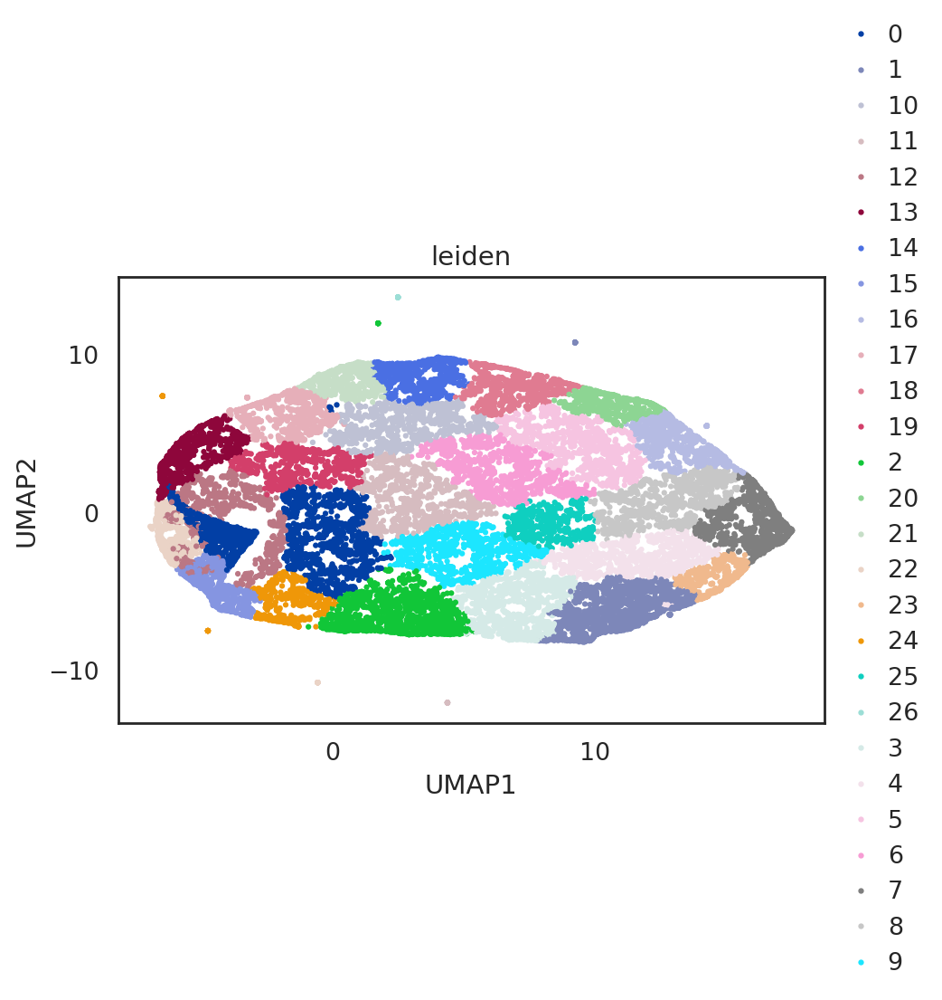

In [50]:
si.pl.umap(
    adata_C,color=['leiden'],
    # dict_palette={'spatialLIBD': palette_celltype},
    fig_size=(6,4),
    drawing_order='random'
)

In [7]:
# Save
adata_C_fn = f'{workdir}/adata_C.h5ad'
adata_C_fn


'data/10/adata_C.h5ad'

In [53]:
adata_C.write(adata_C_fn)

# Co-embedding

In [54]:
adata_all = si.tl.embed(adata_ref=adata_C,list_adata_query=[adata_G])
adata_all.obs.head()

Performing softmax transformation for query data 0;


,cell_1_barcode,cell_2_barcode,n_counts,n_genes,pct_genes,pct_mt,pbg_id,spatialLIBD_1,spatialLIBD_2,spatialLIB_combined,leiden,id_dataset
20187,CTATCGACGAAATACA-1,GTCCTACGAATAGTCT-1,5761.351562,2983.0,0.188583,0.018434,C.20187,L4,L4,L4-L4,3,ref
3696,AGTTTGGCCAGACCTA-1,TTGATTAGCTGTTTCT-1,4977.696777,2146.0,0.135668,0.021343,C.3696,L6,L6,L6-L6,5,ref
24369,CCTCGCGCGATATAGG-1,TTAGCTAATACGATCT-1,4028.272217,1575.0,0.099570,0.027783,C.24369,L1,L1,L1-L1,12,ref
989,AAACATTTCCCGGATT-1,TTAGTAAACCTGCTCT-1,6207.882324,3307.0,0.209066,0.016930,C.989,L5,L5,L5-L5,1,ref
19167,GGGCAACCGCACGTGC-1,GTCAAAGAAGTGGTGT-1,2897.825195,894.0,0.056518,0.030800,C.19167,WM,WM,WM-WM,16,ref


In [65]:
adata_all.obs['entity_anno'] = ""
adata_all.obs.loc[adata_C.obs_names, 'entity_anno'] = adata_all.obs.loc[adata_C.obs_names, 'spatialLIB_combined']
adata_all.obs.loc[adata_G.obs_names, 'entity_anno'] = 'gene'
adata_all.obs.head()

,cell_1_barcode,cell_2_barcode,n_counts,n_genes,pct_genes,pct_mt,pbg_id,spatialLIBD_1,spatialLIBD_2,spatialLIB_combined,leiden,id_dataset,entity_anno
20187,CTATCGACGAAATACA-1,GTCCTACGAATAGTCT-1,5761.351562,2983.0,0.188583,0.018434,C.20187,L4,L4,L4-L4,3,ref,L4-L4
3696,AGTTTGGCCAGACCTA-1,TTGATTAGCTGTTTCT-1,4977.696777,2146.0,0.135668,0.021343,C.3696,L6,L6,L6-L6,5,ref,L6-L6
24369,CCTCGCGCGATATAGG-1,TTAGCTAATACGATCT-1,4028.272217,1575.0,0.099570,0.027783,C.24369,L1,L1,L1-L1,12,ref,L1-L1
989,AAACATTTCCCGGATT-1,TTAGTAAACCTGCTCT-1,6207.882324,3307.0,0.209066,0.016930,C.989,L5,L5,L5-L5,1,ref,L5-L5
19167,GGGCAACCGCACGTGC-1,GTCAAAGAAGTGGTGT-1,2897.825195,894.0,0.056518,0.030800,C.19167,WM,WM,WM-WM,16,ref,WM-WM


In [18]:
paired_palette_celltype_anno = paired_palette_celltype.copy()
paired_palette_celltype_anno['gene'] = 'gray'

In [67]:
si.tl.umap(adata_all,n_neighbors=15,n_components=2)

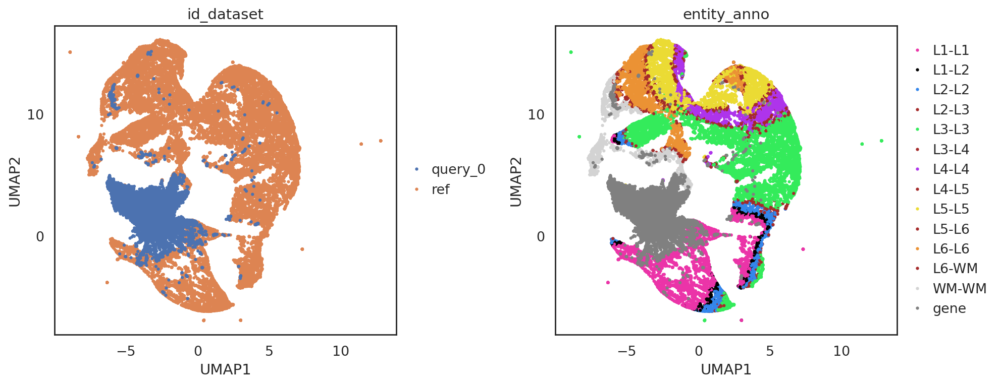

In [69]:
si.pl.umap(adata_all,color=['id_dataset', 'entity_anno'],
           dict_palette={'entity_anno': paired_palette_celltype_anno},
           drawing_order='original',
           fig_size=(6,5))

3000 variable genes are selected.


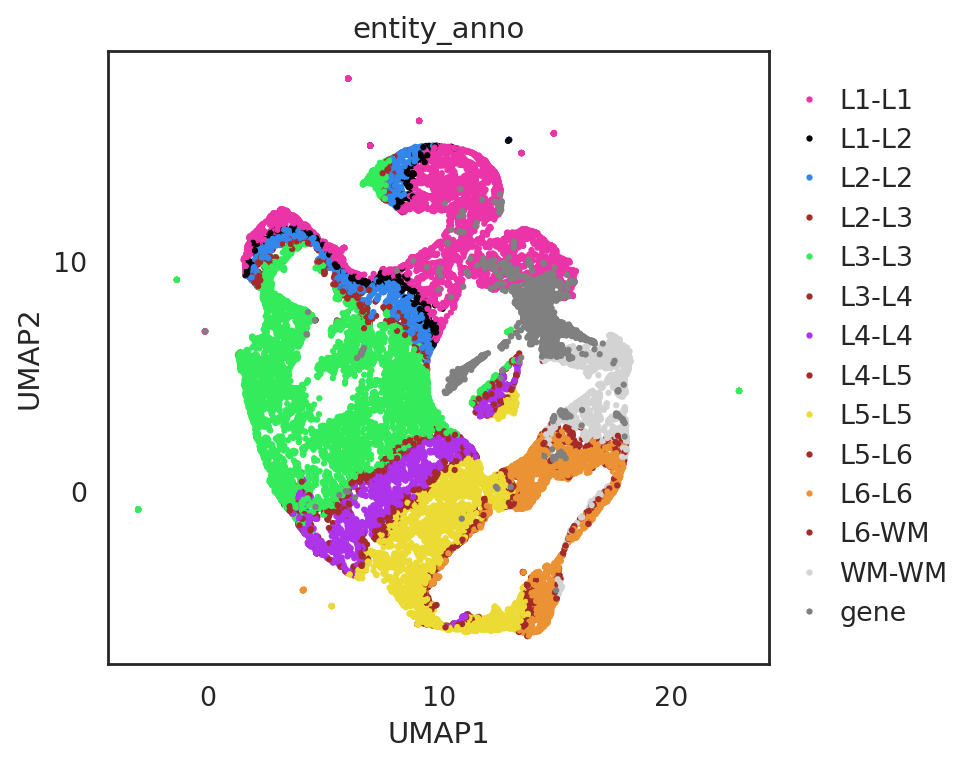

In [71]:
# obtain variable genes
si.pp.select_variable_genes(k2_adata, n_top_genes=3000)
var_genes = k2_adata.var_names[k2_adata.var['highly_variable']].tolist()
# obtain SIMBA embeddings of cells and variable genes
adata_all2 = adata_all[list(adata_C.obs_names) + var_genes,].copy()
# visualize them using UMAP
si.tl.umap(adata_all2,n_neighbors=15,n_components=2)
si.pl.umap(adata_all2,color=['entity_anno'],
           dict_palette={'entity_anno': paired_palette_celltype_anno},
           drawing_order='original',
           fig_size=(6,5))

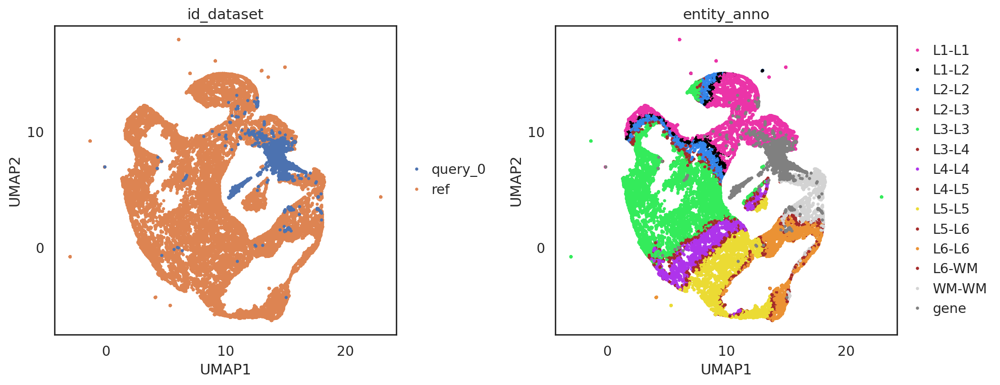

In [72]:
si.pl.umap(adata_all2,color=['id_dataset', 'entity_anno'],
           dict_palette={'entity_anno': paired_palette_celltype_anno},
           drawing_order='original',
           fig_size=(6,5))

In [7]:
adata_C_fn = f"{workdir}/adata_C.h5ad"
adata_G_fn = f"{workdir}/adata_G.h5ad"
adata_all_fn = f"{workdir}/adata_all.h5ad"

In [76]:
adata_C.write(adata_C_fn)
adata_G.write(adata_G_fn)
adata_all.write(adata_all_fn)

## Spatiall variable genes

In [8]:
adata_C = sc.read_h5ad(adata_C_fn)
adata_G = sc.read_h5ad(adata_G_fn)
adata_all = sc.read_h5ad(adata_all_fn)

adata_fn = "/data/pinello/PROJECTS/2025-01-31_CC_Spatial_SIMBA/SIMBA_in_space/data/human_DLPFC/151507.h5ad"
adata_CG = sc.read_h5ad(adata_fn)

In [9]:
import squidpy as sq

In [10]:
sq.gr.spatial_neighbors(adata_CG, 
                        spatial_key="spatial",
                        coord_type="grid", 
                        delaunay=True)

sq.gr.spatial_autocorr(adata_CG, mode="moran", 
                       n_perms=100, n_jobs=10, 
                       genes=adata_CG.var_names)

100%|██████████| 100/100 [00:19<00:00,  5.20/s]


In [11]:
moranI_df = adata_CG.uns['moranI'].copy()

In [15]:
spatially_variable_genes = moranI_df.query("pval_z_sim_fdr_bh < 0.1").index.tolist()

/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/data/pinello/SHARED_SOFTWARE/anaconda_latest/envs/cc_envs/cc_mamba_simba/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


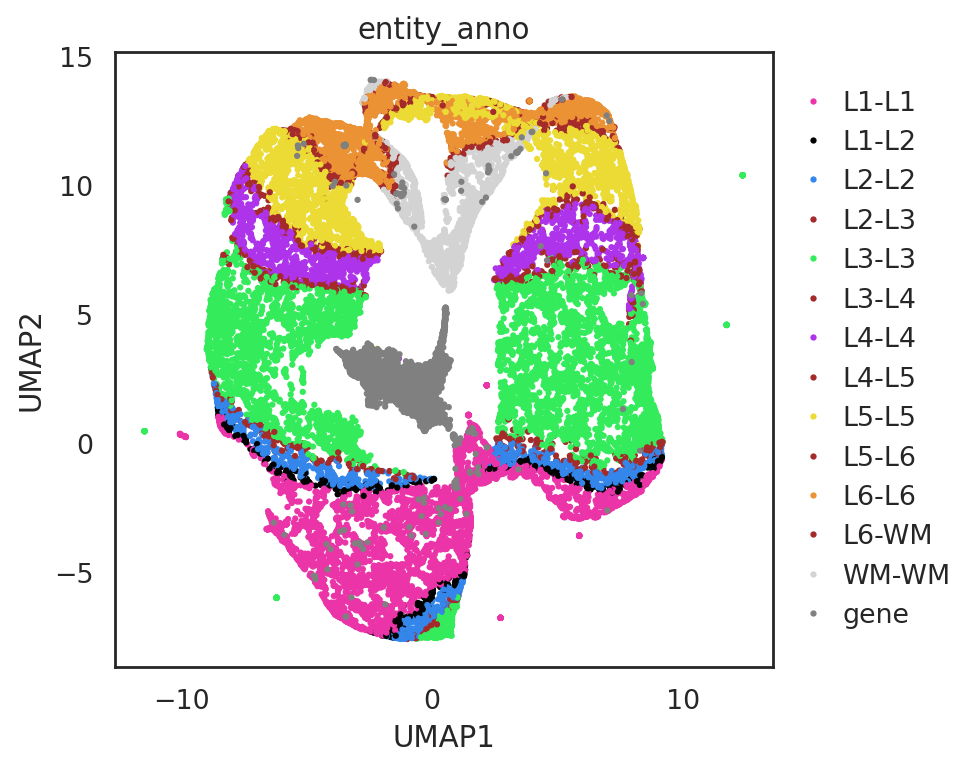

In [19]:
# obtain SIMBA embeddings of cells and variable genes
adata_all3 = adata_all[list(adata_C.obs_names) + spatially_variable_genes,].copy()
# visualize them using UMAP
si.tl.umap(adata_all3,n_neighbors=15,n_components=2)
si.pl.umap(adata_all3,color=['id_dataset', 'entity_anno'],
           dict_palette={'entity_anno': paired_palette_celltype_anno},
           drawing_order='original',
           fig_size=(6,5))


# Contour plot
Junxi Feng

In [ ]:
# Contour plot: Junxi
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines
from scipy.stats import gaussian_kde

# Set publication-quality figure settings
plt.rcParams['pdf.fonttype'] = 42  # Ensure editable fonts in PDF
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['figure.dpi'] = 300

def plot_umap_with_contours(
    embedding, labels, highlight_points, label_to_color, top_variantcell_umap, top_genecell_umap,
    title="UMAP Contour Visualization", 
    # pdf_path="umap_contour_plot.pdf"
):
    """
    Creates a UMAP scatter plot with density contours for peaks and genes, displayed in two subplots.

    Parameters:
        embedding (ndarray): Array of shape (n_samples, 2) for UMAP embeddings.
        labels (list): List of cell type labels corresponding to the points.
        highlight_points (dict): Dictionary of points to highlight with colors.
        label_to_color (dict): Mapping of cell type labels to colors.
        top_variantcell_umap (DataFrame): Data containing coordinates for peak (variant) contour plotting.
        top_genecell_umap (DataFrame): Data containing coordinates for gene contour plotting.
        title (str): Title of the plot.
        pdf_path (str): File path to save the plot as a PDF.
    """

    # Create subplots with 2 columns (1 row, 2 columns)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

    # Function to plot KDE contours
    def plot_contours(ax, data, color, alpha, label):
        umap_x = data['umap1']
        umap_y = data['umap2']
        kde = gaussian_kde([umap_x, umap_y])
        x_min, x_max = umap_x.min() - 3, umap_x.max() + 3
        y_min, y_max = umap_y.min() - 3, umap_y.max() + 3
        x_grid, y_grid = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
        z_grid = kde(np.vstack([x_grid.flatten(), y_grid.flatten()]))
        ax.contour(x_grid, y_grid, z_grid.reshape(x_grid.shape), levels=10, colors=color, alpha=alpha)
        ax.set_title(label, fontsize=14, fontweight="bold")

    # Scatter plot of all cells
    def scatter_cells(ax):
        colors_mapped = [label_to_color[label] for label in labels]
        ax.scatter(
            embedding[:, 0], embedding[:, 1],
            c=colors_mapped, s=10, alpha=0.6, edgecolors='none'
        )

    # **First Subplot: Peak (Variant) Contour**
    scatter_cells(axes[0])
    plot_contours(axes[0], top_variantcell_umap, color='red', alpha=0.5, label="chr19-555694-556592")

    # **Second Subplot: Gene Contour**
    scatter_cells(axes[1])
    plot_contours(axes[1], top_genecell_umap, color='blue', alpha=0.5, label="BSG")

    # Highlight specific points in both subplots
    #for ax in axes:
     #   for name, (x, y, color) in highlight_points.items():
      #      ax.scatter(x, y, color=color, s=80, label=name, edgecolor="black", linewidth=0.8)
       #     ax.text(x + 0.5, y + 0.5, name, fontsize=10, color=color, fontweight="bold")

    # Add common labels
    fig.suptitle(title, fontsize=16, fontweight="bold", y=1.02)
    for ax in axes:
        ax.set_xlabel("UMAP1", fontsize=14)
        ax.set_ylabel("UMAP2", fontsize=14)
        ax.grid(alpha=0.3)

    # Create a legend for cell types
    handles = [
        mlines.Line2D([], [], color=color, marker='o', linestyle='None',
                      markersize=8, label=label)
        for label, color in label_to_color.items()
    ]
    #handles.append(mlines.Line2D([], [], color="black", marker='*', linestyle='None', markersize=8, label="Peak"))

    axes[1].legend(handles=handles, title="Cell Types", bbox_to_anchor=(1.05, 1),
                   frameon=False, loc='upper left', labelspacing=1.4, fontsize=10)

    # Adjust layout and save as PDF
    plt.tight_layout()
    # plt.savefig(pdf_path, format="pdf", bbox_inches="tight")

    plt.show()

In [ ]:
# Call the function

# Example usage:
highlight_points = {
    "BSG": (
        test_embedding.loc["BSG", "umap1"],
        test_embedding.loc["BSG", "umap2"],
        "red"
    ),
    "chr19_555694_556592": (
        test_embedding.loc["chr19_555694_556592", "umap1"],
        test_embedding.loc["chr19_555694_556592", "umap2"],
        "black"
    )
}

plot_umap_with_contours(
    embedding=trans.embedding_,
    labels=adata_all.obs.cell_type.tolist(),
    highlight_points=highlight_points,
    label_to_color=label_to_color,
    top_variantcell_umap=top_peakcell_umap,  # First subplot: Peak Contour
    top_genecell_umap=top_genecell_umap,  # Second subplot: Gene Contour
    title="",
    pdf_path="../benchmark/check_model/Finalized_notebooks/Figures_fixed/BSG-chr19_555694_556592.pdf"
)